## 2. Grouping Users together!

### 2.1 Getting your data + feature engineering
Sometimes, the features (variables, fields) are not given in a dataset but can be created from it; this is known as feature engineering. For example, the original dataset has several clicks done by the same user, so grouping data by user_id will allow you to create new features for each user:

a) Favorite genre (i.e., the genre on which the user spent the most time)

b) Average click duration

c) Time of the day (Morning/Afternoon/Night) when the user spends the most time on the platform (the time spent is tracked through the duration of the clicks)

d) Is the user an old movie lover, or is he into more recent stuff (content released after 2010)?

e) Average time spent a day by the user (considering only the days he logs in)

Consider at least 10 additional features that can be generated for each user_id (you can use chatGPT or other LLM tools for suggesting features to create). Describe each of them and add them to the previous dataset you made (the one with five features). In the end, you should have for each user at least 15 features (5 recommended + 10 suggested by you).

In [29]:
import pandas as pd
import ast
import plotly.express as px
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [2]:
df=pd.read_csv('vodclickstream_uk_movies_03.csv', parse_dates=['datetime','release_date'])

In [3]:
del df['Unnamed: 0']

In [4]:
df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671736 entries, 0 to 671735
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   datetime      671736 non-null  datetime64[ns]
 1   duration      671736 non-null  float64       
 2   title         671736 non-null  object        
 3   genres        671736 non-null  object        
 4   release_date  641432 non-null  datetime64[ns]
 5   movie_id      671736 non-null  object        
 6   user_id       671736 non-null  object        
dtypes: datetime64[ns](2), float64(1), object(4)
memory usage: 35.9+ MB


In [6]:
df.head()

,datetime,duration,title,genres,release_date,movie_id,user_id
0,2017-01-01 01:15:09,0.0,"Angus, Thongs and Perfect Snogging","Comedy, Drama, Romance",2008-07-25,26bd5987e8,1dea19f6fe
1,2017-01-01 13:56:02,0.0,The Curse of Sleeping Beauty,"Fantasy, Horror, Mystery, Thriller",2016-06-02,f26ed2675e,544dcbc510
2,2017-01-01 15:17:47,10530.0,London Has Fallen,"Action, Thriller",2016-03-04,f77e500e7a,7cbcc791bf
3,2017-01-01 16:04:13,49.0,Vendetta,"Action, Drama",2015-06-12,c74aec7673,ebf43c36b6
4,2017-01-01 19:16:37,0.0,The SpongeBob SquarePants Movie,"Animation, Action, Adventure, Comedy, Family, ...",2004-11-19,a80d6fc2aa,a57c992287


In [7]:
df=df.dropna()

In [8]:
df.shape

(641432, 7)

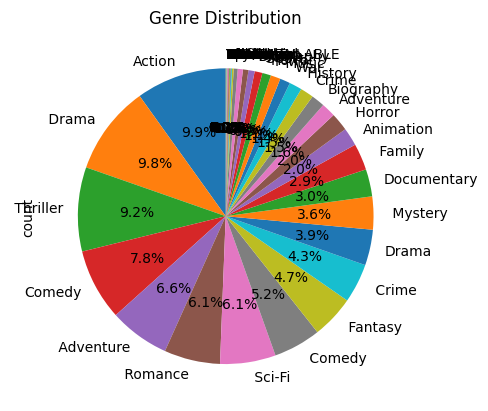

In [9]:
genre_distribution = df['genres'].str.split(',').explode().value_counts()
genre_distribution.plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Genre Distribution')
plt.show()

Features suggested by the Question:

In [10]:
# a) Favorite genre for each user
favorite_genre = df.groupby('user_id')['genres'].agg(lambda x: x.str.split(',').explode().mode().iloc[0])

In [11]:
# b) Average click duration for each user
average_click_duration = df.groupby('user_id')['duration'].mean()

In [12]:
# c) Time of the day when the user spends the most time
df['hour_of_day'] = df['datetime'].dt.hour
time_of_day_mode = df.groupby('user_id')['hour_of_day'].agg(lambda x: x.mode().iloc[0])

In [13]:
# Map time of day to categories (Morning, Afternoon, Night)
time_of_day_mapping = {range(6, 12): 'Morning', range(12, 18): 'Afternoon', range(18, 24): 'Night'}
time_of_day = time_of_day_mode.apply(lambda x: next((v for k, v in time_of_day_mapping.items() if x in k), None))

In [14]:
# d) Determine if the user is into old or recent movies
df['old_movie_lover'] = df['release_date'].dt.year < 2010

In [15]:
old_movie_lover = df.groupby('user_id')['old_movie_lover'].any().reset_index(name='old_movie_lover')

In [16]:
# e) Average time spent per day for each user
df['date'] = df['datetime'].dt.date
average_time_per_day = df.groupby(['user_id', 'date'])['duration'].sum().groupby('user_id').mean()

Features engineered with the help of ChatGPT:

In [17]:
#The number of unique genres the user has interacted with.
genre_diversity = df.groupby('user_id')['genres'].agg(lambda x: len(set(x.str.split(',').explode())))
df['day_of_week'] = df['datetime'].dt.day_name()
most_active_day = df.groupby('user_id')['day_of_week'].agg(lambda x: x.mode().iloc[0])
session_threshold = 30 * 60  # Assuming a session lasts for 30 minutes
df['session_id'] = (df['datetime'] - df['datetime'].shift(1) > pd.Timedelta(session_threshold, 's')).cumsum()
avg_clicks_per_session = df.groupby('user_id')['session_id'].value_counts().groupby('user_id').mean()
favorite_release_year = df.groupby('user_id')['release_date'].agg(lambda x: x.dt.year.mode().tolist())
prime_time_clicks = df[(df['hour_of_day'] >= 18) & (df['hour_of_day'] < 24)].groupby('user_id')['user_id'].count() / df.groupby('user_id')['user_id'].count()
df['is_weekend'] = df['datetime'].dt.weekday // 5
weekend_preference = df.groupby('user_id')['is_weekend'].mean()
session_durations = df.groupby(['user_id', 'session_id'])['duration'].sum()
longest_session_duration = session_durations.groupby('user_id').max()
recent_movies_clicks = df[df['release_date'] >= df['release_date'].max() - pd.DateOffset(years=1)].groupby('user_id')['user_id'].count() / df.groupby('user_id')['user_id'].count()
recent_movies_duration = df[df['release_date'] >= df['release_date'].max() - pd.DateOffset(months=1)].groupby('user_id')['duration'].mean()

In [18]:
# Calculate the count of each genre for each user
genre_counts = df.groupby(['user_id', 'genres'])['user_id'].count().reset_index(name='genre_count')

# Find the genre with the maximum count for each user
dominant_genre = genre_counts.groupby('user_id').apply(lambda x: x.loc[x['genre_count'].idxmax()]['genres'])

# Map the dominant genre to a numerical score
genre_mapping = {genre: score for score, genre in enumerate(dominant_genre.unique())}
genre_preference_score = dominant_genre.map(genre_mapping)

In [19]:
feature_view=pd.DataFrame({
    'favorite_genre': favorite_genre,
    'average_click_duration': average_click_duration,
    'time_of_day': time_of_day,
    'average_time_per_day': average_time_per_day,
    'genre_diversity': genre_diversity,
    'most_active_day': most_active_day,
    'avg_clicks_per_session':avg_clicks_per_session,
    'favorite_release_year':favorite_release_year,
    'prime_time_clicks': prime_time_clicks,
    'weekend_preference':weekend_preference,
    'longest_session_duration':longest_session_duration,
    'recent_movies_clicks':recent_movies_clicks,
    'genre_preference_score':genre_preference_score,
    'avg_duration_recent_interactions':recent_movies_duration
    }).reset_index()

In [20]:
feature_view = feature_view.merge(old_movie_lover, how='left', on='user_id')

In [21]:
feature_view

,user_id,favorite_genre,average_click_duration,time_of_day,average_time_per_day,genre_diversity,most_active_day,avg_clicks_per_session,favorite_release_year,prime_time_clicks,weekend_preference,longest_session_duration,recent_movies_clicks,genre_preference_score,avg_duration_recent_interactions,old_movie_lover
0,00004e2862,Drama,0.000000,Night,0.000,3,Tuesday,1.0,[2001],1.000000,0.000000,0.0,NaN,0,NaN,True
1,000052a0a0,Thriller,2024.166667,Night,4858.000,19,Sunday,1.0,[2012],0.750000,0.458333,7857.0,NaN,1,NaN,True
2,000090e7c8,Sci-Fi,0.000000,Night,0.000,3,Friday,1.0,[2018],1.000000,0.000000,0.0,NaN,2,NaN,False
3,000118a755,Horror,0.000000,Night,0.000,1,Thursday,1.0,[1976],1.000000,0.000000,0.0,NaN,3,NaN,True
4,000296842d,Mystery,9663.375000,Night,38653.500,4,Monday,1.0,[2018],0.625000,0.250000,62860.0,NaN,4,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157910,fffd9bf758,Crime,8495.000000,Night,8495.000,3,Wednesday,1.0,[2015],1.000000,0.000000,8495.0,NaN,597,NaN,False
157911,fffe7b777b,Sci-Fi,1785.000000,Afternoon,1785.000,3,Saturday,1.0,[2017],NaN,1.000000,1785.0,NaN,140,NaN,False
157912,fffeac83be,Documentary,40606.272727,Night,55833.625,12,Wednesday,1.0,[2015],0.909091,0.090909,173436.0,NaN,55,NaN,True
157913,ffff2c5f9e,Comedy,0.000000,Afternoon,0.000,5,Sunday,1.0,"[2007, 2013]",NaN,1.000000,0.0,NaN,212,NaN,True


In [22]:
feature_view.to_csv('feature_engineered.csv')

### 2.2 Choose your features (variables)!
You may notice that you have plenty of features to work with now. So, it would be best to find a way to reduce the dimensionality (reduce the number of variables to work with). You can follow the subsequent directions to achieve it:

**To normalise or not to normalise? That's the question.** Sometimes, it is worth normalizing (scaling) the features. Explain if it is a good idea to perform any normalization method. If you think the normalization should be used, apply it to your data (look at the available normalization functions in the scikit-learn library).

Select one **method for dimensionality reduction** and apply it to your data. Some suggestions are Principal Component Analysis, Multiple Correspondence Analysis, Singular Value Decomposition, Factor Analysis for Mixed Data, Two-Steps clustering. Make sure that the method you choose applies to the features you have or modify your data to be able to use it. Explain why you chose that method and the limitations it may have.

When to Normalize:
Algorithms Sensitive to Scale:

Algorithms like k-nearest neighbors, support vector machines, and neural networks can be sensitive to the scale of features. Normalizing ensures that no single feature dominates the learning process.
Gradient Descent Optimization:

Gradient-based optimization algorithms, like those used in neural networks, converge faster when features are on a similar scale. This helps prevent oscillations and convergence issues.
Distance-Based Metrics:

If your analysis involves distance calculations (e.g., clustering or k-nearest neighbors), normalization is often necessary to ensure that all features contribute equally.
When Not to Normalize:
Tree-Based Models:

Decision trees and random forests are generally insensitive to feature scale. These models make decisions based on relative feature importance rather than the absolute scale.
Interpretability:

If interpretability is crucial, and the scale of features has real-world meaning, you might prefer to keep the original scale for ease of interpretation.

Let's use the MinMaxScaler from scikit-learn to scale the features between 0 and 1. We will exclude categorical features like 'favorite_genre' and 'time_of_day' from normalization, as these features are not continuous numerical values.

In [52]:
dataset=pd.read_csv('feature_engineered.csv', index_col=0)

In [53]:
dataset.loc[5,'favorite_release_year']

'[2011, 2012, 2016]'

It appears that, in the dataset, the favorite_release_year feature has more than one year values in some of the cases, favorite_release_year was calculated on the basis of mode of the years, and sometimes multiple years got the same mode. To deal with this, I wilkl take a bias of only to consider the first year value as the favorite release year. First am converting these to list to access easily, then am counting how many such cases are there and finally, I am applying the transformation to consider just one value for the favourite release year.

In [54]:
#Converting favorite release year string representations to lists
dataset['favorite_release_year'] = dataset['favorite_release_year'].apply(ast.literal_eval)

In [55]:
#getting the count of cases where favourite release year is multiple.
dataset['favorite_release_year'].apply(lambda x: len(x) if isinstance(x, list) else 0).gt(1).sum()

35974

In [56]:
#applying the transformation to include single value
dataset['favorite_release_year']=dataset['favorite_release_year'].apply(lambda x: x[0]) 

In [57]:
dataset.loc[5,'favorite_release_year'] #checking now there is only a single value for each of the favorite release years.

2011

In [58]:
numerical_features = dataset.select_dtypes(['float64','int64']).columns

In [ ]:
# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Fit the scaler on the selected columns and transform them
dataset[numerical_features] = scaler.fit_transform(dataset[numerical_features])

In [60]:
dataset.isnull().sum()

user_id                                  0
favorite_genre                           0
average_click_duration                   0
time_of_day                          20851
average_time_per_day                     0
genre_diversity                          0
most_active_day                          0
avg_clicks_per_session                   0
favorite_release_year                    0
prime_time_clicks                    45608
weekend_preference                       0
longest_session_duration                 0
recent_movies_clicks                157550
genre_preference_score                   0
avg_duration_recent_interactions    157878
old_movie_lover                          0
dtype: int64

Now we will impute the dataset:
Imputing is a procedure where missing values in a feature are replaced with typical values within the dataset. By typical, we want it to be as indistinguishable from other values of that feature as possible. 

In [62]:
dataset_imputed= dataset.copy()

In [63]:
dataset_imputed['time_of_day'] = dataset['time_of_day'].fillna(dataset['time_of_day'].mode()[0])

In [64]:
dataset_imputed['prime_time_clicks'] = dataset['prime_time_clicks'].fillna(0)

In [65]:
dataset_imputed['recent_movies_clicks'] = dataset['recent_movies_clicks'].fillna(0)

In [66]:
dataset_imputed['avg_duration_recent_interactions'] = dataset['avg_duration_recent_interactions'].fillna(0)

In [67]:
dataset_imputed.isnull().sum()

user_id                             0
favorite_genre                      0
average_click_duration              0
time_of_day                         0
average_time_per_day                0
genre_diversity                     0
most_active_day                     0
avg_clicks_per_session              0
favorite_release_year               0
prime_time_clicks                   0
weekend_preference                  0
longest_session_duration            0
recent_movies_clicks                0
genre_preference_score              0
avg_duration_recent_interactions    0
old_movie_lover                     0
dtype: int64

Now we will check the correlation between the numerical features:

<Axes: >

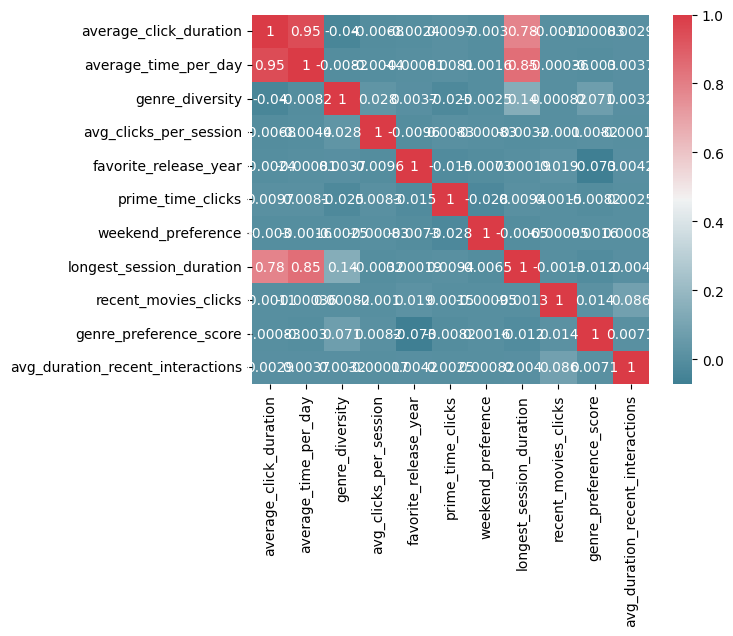

In [68]:
import seaborn as sns
corr = dataset_imputed[numerical_features].corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            annot=True)

It appears that average_click_duration, average_time_per_day, longest_session_duration are highly correlated. So keeping one of these variables, makes more sense and helps in dimensionality reduction. The variable which has lesser correlation with the target, shall be dropped in general. In my understabnding, average_click_duration and longest_session_duration can be dropped and only average_time_per_day can be kept which will essentially represent the previous two. Most other variables can be considered pairwise independent and hence, must be retained.

In [69]:
columns_to_drop=['average_click_duration','avg_clicks_per_session']

In [70]:
#dropping the numerical columns after checking the correlation heatmap.
dataset_pca=dataset_imputed.drop(columns=columns_to_drop)

In [71]:
dataset_pca.select_dtypes(['object','bool']).columns

Index(['user_id', 'favorite_genre', 'time_of_day', 'most_active_day',
       'old_movie_lover'],
      dtype='object')

In [72]:
categorical_features = ['favorite_genre', 'time_of_day', 'most_active_day', 'old_movie_lover']

In [76]:
from sklearn.preprocessing import LabelEncoder
# Convert categorical variables to numerical using LabelEncoder
label_encoder = LabelEncoder()
dataset_pca[categorical_features] = dataset_pca[categorical_features].apply(label_encoder.fit_transform)


<Axes: >

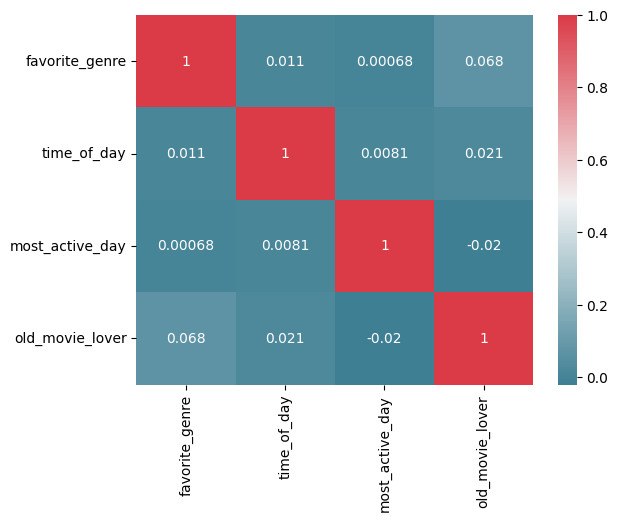

In [78]:
import seaborn as sns
corr2 = dataset_pca[categorical_features].corr()
sns.heatmap(corr2, 
            xticklabels=corr2.columns.values,
            yticklabels=corr2.columns.values,
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            annot=True)

From this heatmap of the correlation of categorical variables, it can be concluded that these categorical variables are uncorrelated, implying that we have to keep these variables.

**Dimensionality Reduction**

Principal Component Analysis (PCA) is a commonly used method for dimensionality reduction, and it is applicable to continuous numerical features. It's particularly effective when dealing with high-dimensional data, aiming to capture the most significant variance in the dataset.

In [83]:
#to apply PCA to all the features now except the user_id feature, we exclude that one from the pca data
pca_data= dataset_pca.loc[:, dataset_pca.columns != 'user_id']

In [ ]:
# Apply PCA to numerical features
pca = PCA(n_components=3)
pca_components = pca.fit_transform(pca_data)

In [85]:
total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter_3d(
    pca_components, x=0, y=1, z=2, size=0.1*np.ones(len(pca_data)), opacity = 1,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    width=800, height=500
)
fig.show()

In [ ]:
# Explained variance (how important each additional principal component is)
pca = PCA().fit(pca_data)

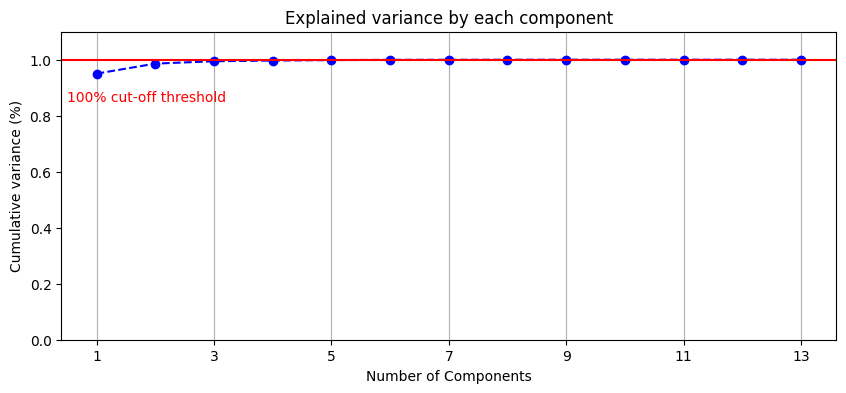

In [87]:
fig, ax = plt.subplots(figsize=(10,4))
xi = np.arange(1, 1+pca_data.shape[1], step=1)
yi = np.cumsum(pca.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+pca_data.shape[1], step=2))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y=1, color='r', linestyle='-')
plt.text(0.5, 0.85, '100% cut-off threshold', color = 'red')
ax.grid(axis='x')

**Justifications of the choices:**

After checking the correlation of the numerical features, I dropped the highly correlated features and only kept the one which will meaningfully represent them.
Then I encoded the categorical features into numerical values, in order to understand their pairwise correlation and I found those features are uncorelated. So I kept all of them.
Then I ran the Principal Component Analysis on the transformed dataset. The PCA showed that all the principal components are explaining about 99.46% of the variance of the dataset. This means, I won't further reduce the dimensionality and now the dataset_pca is essentially containing the features I need to move forward with.

In [89]:
# We are saving the feature reduced and final processed dataset to load in the further answers.
dataset_pca.to_csv('dataset_after_PCA.csv')